In [9]:
import os
from pathlib import Path
import pandas as pd
import vaex
import vaex.ml
import vaex.ml.cluster
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

dir = Path().cwd()
csv = os.path.join(dir, 'output', 'processed_scats.csv')

In [10]:
if not os.path.exists(csv+'.hdf5'):
    df = vaex.from_csv(csv, convert=True, copy_index=False, chunk_size=1000000)
    df.export(csv, shuffle=True)
df = vaex.open(csv+'.hdf5', shuffle=True)
df = df.sample(frac=1)
df.head()

#,site,sum_vol,avg_vol,lat,lon,site_desc,region,dow,hour,month,day
0,111,190,13,0.930619,-0.108481,merrion rd @ ailesbury rd,SCITY,6,7,3,8
1,218,0,0,0.930988,-0.108703,bridge st (ringsend) @ church,SCITY,3,9,1,2
2,709,21,0,0.931446,-0.108901,philipsburgh ave @ shuttle,WCITY1,2,2,1,22
3,506,699,56,0.931292,-0.108138,clontarf rd @ vernon ave,NCITY,1,22,3,3
4,271,0,0,0.931529,-0.108594,malahide rd @ donnycarney rd,NCITY,6,20,3,15
5,199,283,19,0.93113,-0.109262,o'connell st @ henry st & ped at earl st,CCITY,3,13,4,23
6,159,167,12,0.930492,-0.109316,rathmines rd @ highfield rd,WCITY1,5,21,3,28
7,230,37,2,0.93105,-0.109235,college st @ college green,CCITY,2,1,4,15
8,163,511,38,0.930891,-0.109207,st stephens green @ earlsfort tce,SCITY,2,14,4,22
9,170,278,19,0.930809,-0.10966,scr @ donore av,SCITY,1,0,2,4


In [3]:
len(df)

2280056

In [11]:
small_df = df[:2056]
del small_df['site_desc']
del small_df['region']
del small_df['site']

pca_coord = vaex.ml.PCA(features=['lat', 'lon'], n_components=2, prefix='pca')
small_df = pca_coord.fit_transform(small_df)

cycl_transform_hour = vaex.ml.CycleTransformer(features=['hour'], n=24)
small_df = cycl_transform_hour.fit_transform(small_df)

cycl_transform_dow = vaex.ml.CycleTransformer(features=['dow'], n=7)
small_df = cycl_transform_dow.fit_transform(small_df)

cycl_transform_day = vaex.ml.CycleTransformer(features=['day'], n=31)
small_df = cycl_transform_day.fit_transform(small_df)

# cycl_transform_month = vaex.ml.CycleTransformer(features=['month'], n=12)
# small_df = cycl_transform_month.fit_transform(small_df)

df_train, df_test = small_df.ml.train_test_split(test_size=0.2, verbose=False)


feats = df_train.get_column_names(regex='pca') + \
    df_train.get_column_names(regex='.*_x') + \
    df_train.get_column_names(regex='.*_y')

df_train.head(10)

#,sum_vol,avg_vol,lat,lon,dow,hour,month,day,pca0,pca1,hour_x,hour_y,dow_x,dow_y,day_x,day_y
0,157,12,0.931099,-0.109776,0,13,1,6,-0.000743945,0.000189151,-0.965926,-0.258819,1,0,0.347305,0.937752
1,378,30,0.931751,-0.108792,3,7,2,27,-0.000152412,-0.000832273,-0.258819,0.965926,-0.900969,0.433884,0.688967,-0.724793
2,385,32,0.931458,-0.109428,1,11,2,11,-0.000591798,-0.000287085,-0.965926,0.258819,0.62349,0.781831,-0.612106,0.790776
3,5956,483,0.932449,-0.108544,0,21,3,2,-0.000240536,-0.001568,0.707107,-0.707107,1,0,0.918958,0.394356
4,425,32,0.931328,-0.108917,6,17,3,15,-7.64797e-05,-0.000397662,-0.258819,-0.965926,0.62349,-0.781831,-0.994869,0.101168
5,959,78,0.931843,-0.107923,0,14,3,2,0.000584757,-0.00130211,-0.866025,-0.5,1,0,0.918958,0.394356
6,0,0,0.931676,-0.109003,2,17,2,19,-0.000308184,-0.000671774,-0.258819,-0.965926,-0.222521,0.974928,-0.758758,-0.651372
7,135,8,0.9306,-0.109791,5,0,4,11,-0.000535028,0.000642393,1,0,-0.222521,-0.974928,-0.612106,0.790776
8,473,33,0.931209,-0.109488,6,19,4,26,-0.000534648,-3.77971e-05,0.258819,-0.965926,0.62349,-0.781831,0.528964,-0.848644
9,1832,149,0.930036,-0.107795,1,17,1,7,0.00150391,0.000259492,-0.258819,-0.965926,0.62349,0.781831,0.151428,0.988468


In [13]:
from sklearn.linear_model import SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from vaex.ml.sklearn import IncrementalPredictor, Predictor

# model = SGDRegressor(learning_rate='constant', eta0=0.0001, random_state=42)
# vaex_model = IncrementalPredictor(
#     features=feats,
#     target='avg_vol',
#     model=model,
#     batch_size=11_000_000,
#     num_epochs=1000,
#     shuffle=False,
#     prediction_name='p_avg_vol'
# )
# vaex_model.fit(df=df_train, progress='widget')

# model = KNeighborsRegressor(weights='uniform')
# vaex_model = Predictor(
#     features=feats,
#     target='avg_vol',
#     model=model,
#     prediction_name='p_avg_vol'
# )
# vaex_model.fit(df=df_train)

model = RandomForestRegressor(random_state=42, n_estimators=7*24, oob_score=True)
vaex_model = Predictor(
    features=feats,
    target='avg_vol',
    model=model,
    prediction_name='p_avg_vol'
)
vaex_model.fit(df=df_train)


df_train = vaex_model.transform(df_train)
df_train.head(10)[['p_avg_vol', 'avg_vol'] + feats]

#,p_avg_vol,avg_vol,pca0,pca1,hour_x,dow_x,day_x,hour_y,dow_y,day_y
0,38.3631,12,-0.000743945,0.000189151,-0.965926,1,0.347305,-0.258819,0,0.937752
1,29.006,30,-0.000152412,-0.000832273,-0.258819,-0.900969,0.688967,0.965926,0.433884,-0.724793
2,45.0595,32,-0.000591798,-0.000287085,-0.965926,0.62349,-0.612106,0.258819,0.781831,0.790776
3,333.917,483,-0.000240536,-0.001568,0.707107,1,0.918958,-0.707107,0,0.394356
4,37.6964,32,-7.64797e-05,-0.000397662,-0.258819,0.62349,-0.994869,-0.965926,-0.781831,0.101168
5,79.5357,78,0.000584757,-0.00130211,-0.866025,1,0.918958,-0.5,0,0.394356
6,43.869,0,-0.000308184,-0.000671774,-0.258819,-0.222521,-0.758758,-0.965926,0.974928,-0.651372
7,18.6012,8,-0.000535028,0.000642393,1,-0.222521,-0.612106,0,-0.974928,0.790776
8,42.3988,33,-0.000534648,-3.77971e-05,0.258819,0.62349,0.528964,-0.965926,-0.781831,-0.848644
9,133.893,149,0.00150391,0.000259492,-0.258819,0.62349,0.151428,-0.965926,0.781831,0.988468


In [ ]:
# df_train.head(30)[ ['p_avg_vol', 'avg_volume'] + feats]
# df_train.state_write('./output/scats_model.json')
# df_train.state_load('./output/scats_model.json')

In [7]:
state = df_train.state_get()
df_test.state_set(state)
df_test.head(10)[['p_avg_vol', 'avg_vol'] + list(df_test.columns) + feats]

#,p_avg_vol,avg_vol,sum_vol,lat,lon,dow,hour,month,day,pca0,pca1,hour_x,dow_x,day_x,hour_y,dow_y,day_y
0,31.256,12,149,0.930792,-0.109677,6,6,1,19,-0.000522542,0.000425883,6.12323e-17,0.62349,-0.758758,1,-0.781831,-0.651372
1,55.7321,37,463,0.930951,-0.110323,4,1,1,24,-0.0011735,0.000559656,0.965926,-0.900969,0.151428,0.258819,-0.433884,-0.988468
2,108.571,90,1114,0.931864,-0.108302,2,8,3,4,0.000257729,-0.00113374,-0.5,-0.222521,0.688967,0.866025,0.974928,0.724793
3,18.5714,18,252,0.931173,-0.10991,6,1,1,12,-0.000895998,0.000181703,0.965926,0.62349,-0.758758,0.258819,-0.781831,0.651372
4,25.2321,15,198,0.931478,-0.110385,0,22,4,20,-0.00145652,0.000110291,0.866025,1,-0.612106,-0.5,0,-0.790776
5,66.3393,14,212,0.930896,-0.108956,0,20,4,6,8.41154e-05,2.13628e-05,0.5,1,0.347305,-0.866025,0,0.937752
6,71.1488,6,93,0.929273,-0.107172,3,21,2,27,0.00239236,0.000720371,0.707107,-0.900969,0.688967,-0.707107,0.433884,-0.724793
7,3.48214,1,26,0.93086,-0.110393,3,3,2,20,-0.00119857,0.000672049,0.707107,-0.900969,-0.612106,0.707107,0.433884,-0.790776
8,68.256,0,0,0.93141,-0.109454,4,21,1,10,-0.000586702,-0.000228551,0.707107,-0.900969,-0.440394,-0.707107,-0.433884,0.897805
9,35.1369,10,175,0.930308,-0.107958,5,6,1,11,0.00123753,0.000123745,6.12323e-17,-0.222521,-0.612106,1,-0.974928,0.790776


In [8]:
# vaex_model.predict(df_test)

In [8]:
train_mae = df_train.mean(np.abs(df_train.p_avg_vol - df_train.avg_vol))
train_mse = df_train.mean((df_train.p_avg_vol - df_train.avg_vol)**2)

test_mae = df_test.mean(np.abs(df_test.p_avg_vol - df_test.avg_vol))
test_mse = df_test.mean((df_test.p_avg_vol - df_test.avg_vol)**2)

print(train_mae, train_mse, '\n', test_mae, test_mse)

# 39 38 SGDR
# 32 38 KmeansR
# 11 32 RandomForest
# 35 34 gradient boosting regression
# 0.078 38 extraTreesRegressor
# 38 37 passiveAgressiveRegressor

14.74528337778879 505.5763873403702 
 41.7863032479821 3493.873601062701


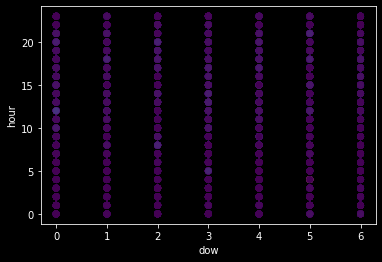

In [32]:
small_df[:20000].scatter(small_df.dow, small_df.hour, c_expr=small_df.avg_vol)

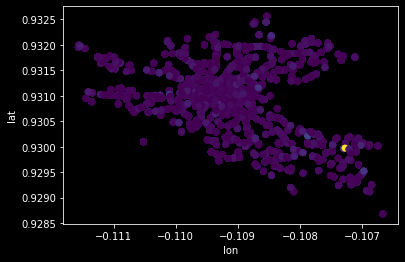

In [33]:
small_df[:20000].scatter(small_df.lon, small_df.lat, c_expr=small_df.avg_vol)

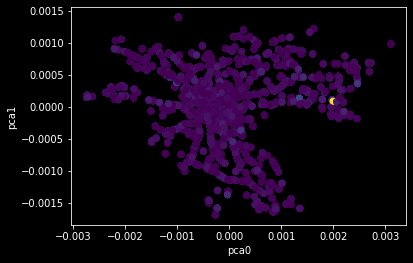

In [34]:
small_df[:20000].scatter(small_df.pca0, small_df.pca1, c_expr=small_df.avg_vol)